# VGG Net 구현

## Initial

In [2]:
import torch
import torchvision
import torchvision.transforms as transforms


torch libary init

In [5]:
torch.cuda.is_available()

True

torch.cuda.is_available 값이 True 면, 현재 GPU를 사용한 학습이 가능하다는 뜻, False면 불가능

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms

import torch.nn as nn
import torch.nn.functional as F

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

trainset = torchvision.datasets.STL10(root='./data', split='train', download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

testset = torchvision.datasets.STL10(root='./data', split='test', download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=False)

Files already downloaded and verified
Files already downloaded and verified


[Pytorch tutorial](http://pytorch.kr/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py) 을 참고하여 구현하였다.

STL10 데이터셋을 가져오도록 했다.(원본 [출처](https://cs.stanford.edu/~acoates/stl10/)

STL10 데이터셋은 Stanford 대학에서 만든 데이터 셋 으로, 다양한 이미지들을 미리 10개의 클래스로 나누어 놓고, 이미지 별 정답 데이터를 같이 제공해주는 데이터셋 이다. 이미지 학습에 자주 사용되는 데이터셋 이며,(이외에도, [Cifar10/100](https://www.cs.toronto.edu/~kriz/cifar.html): 10개/100개 의 클래스로 나눠놓은 데이터 셋, [MNIST](http://yann.lecun.com/exdb/mnist/): 0~9 까지의 숫자 손글씨 데이터 셋 등이 자주 사용된다.) pytorch에서는 torchvision이라는 라이브러리에서 쉬운 사용을 위한 방법을 제공한다.

torchbision.datasets.\[원하는 데이터 셋 이름\] 과 같은 명명 방식으로 가져오는 함수가 구성되어 있으며, 기본적으로는 각 함수별로 유사하지만 직접 수행해본 결과, STL10과 Cifar10/100 은 train set과 test set을 나누는 방법이 다르다.

STL10 의 경우는 위와 같이, argument 에 `split='train'` or `split='test'` 로 작성하여 나누게 되고, Cifar10/100 의 경우에는 argument에  `train=True` or `train=False` 와 같이 작성하여 나누는 방식을 취한다.

`batch_size=64` 는 미니배치(한번에 모델에 동시에 돌려 학습시킬 사이즈) 이다.

많은 pythonic 한 라이브러리 들이, 같은 형태를 취한다면, 이용법을 최대한 맞추게 되어 있는데, 그렇지 못해서 이 부분이 다소 아쉬웠다.

`transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])`

이 부분은, 데이터셋을 가져올 때, 형태를 변환해주는 코드로, 위 부터 설명하면 아래와 같다. ToTensor의 위치에 따라, Resize와 Normalize의 순서는 입력한 순서와 같아야 한다.

`transforms.Resize(224)` : 이미지의 크기를 224x224로 변환, 이는 VGG Net에서 대상으로 하는 이미지의 크기가 244x244 이기 때문

`transforms.ToTensor()` : 받아오는 데이터를 pytorch에서 사용하기 위한 Tensor 자료 구조로 변환

`transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))` : 받아오는 데이터를 노말라이징, 입력 전에 노말라이징이 필요한가 여부는 아직 논의가 되고있는 것으로 보이지만, 노말라이징을 하는 경우, 특정 부분이 너무 밝거나 어둡다거나 해서 데이터가 튀는 현상을 막아줌

 deer  deer plane  frog


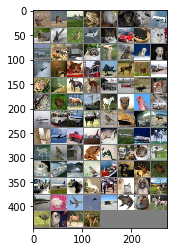

In [93]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))



imshow는 다른 사람이 구현한 내용을 가져왔다. ([Pytorch tutorial 참조](http://pytorch.kr/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py))

간단하게 말하면, matplotlib에 있는 pyplot 을 써서 데이터 셋에 있는 이미지를 읽으면, 비교적 어두운 색으로 보이는 이미지가 출력된다. (이는 학습을 위한 데이터 셋 이므로, 미리 정규화가 되어있기 때문) 이를 다시 정상적인 이미지로 만들기 위해, 이미지를 unnormalize 하고 plt.imshow에 넣어 출력해 주는 함수이다.

## VGG 모델 구현

In [2]:


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv = nn.Sequential(
            #3 224 128
            nn.Conv2d(3, 64, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(64, 64, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #64 112 64
            nn.Conv2d(64, 128, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #128 56 32
            nn.Conv2d(128, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #256 28 16
            nn.Conv2d(256, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #512 14 8
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2)
        )
        #512 7 4

        self.avg_pool = nn.AvgPool2d(7)
        #512 1 1
        self.classifier = nn.Linear(512, 10)
        """
        self.fc1 = nn.Linear(512*2*2,4096)
        self.fc2 = nn.Linear(4096,4096)
        self.fc3 = nn.Linear(4096,10)
        """

    def forward(self, x):
        
        #print(x.size())
        features = self.conv(x)
        #print(features.size())
        x = self.avg_pool(features)
        #print(avg_pool.size())
        x = x.view(features.size(0), -1)
        #print(flatten.size())
        x = self.classifier(x)
        #x = self.softmax(x)
        return x, features

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

net = Net()
net = net.to(device)
param = list(net.parameters())
print(len(param))
for i in param:
    print(i.shape)
#print(param[0].shape)

28
torch.Size([64, 3, 3, 3])
torch.Size([64])
torch.Size([64, 64, 3, 3])
torch.Size([64])
torch.Size([128, 64, 3, 3])
torch.Size([128])
torch.Size([128, 128, 3, 3])
torch.Size([128])
torch.Size([256, 128, 3, 3])
torch.Size([256])
torch.Size([256, 256, 3, 3])
torch.Size([256])
torch.Size([256, 256, 3, 3])
torch.Size([256])
torch.Size([512, 256, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([10, 512])
torch.Size([10])


VGG Net 논문 본문을 확인하여, VGG19 모델의 구조를 참고 하였다.

![VGG net](https://lh3.googleusercontent.com/lcnV6CKJxBdie7vBXEVtnQL99cw-TaPo-Y88qhXha_GkHIgIUD4YduYzWZIrHzkMm0yGjxUzrd8)

Sequential 을 활용하여 구현하였다. Sequential을 이용할 경우, forward에서 각 레이어를 하나 하나 부르는 대신, 해당 Sequence의 이름을 불러서 한번에 이용 가능하다. 

`features = self.conv(x)`

이후 기존 VGG19 모델과 달리 마지막에는 Average pooling을 하고, Fully Connected Layer를 사용하여 Classification을 하였다. 이는 NIN논문에서 구현된 GAP(NIN논문에서는 Class의 갯수와 같은 채널 수 를 가지는 Conv모델을 마지막에 사용하였으며, 각 채널의 Average 값을 SoftMax에 입력하였다. 즉,FC레이어를 사용하지 않았다.)와 다소 다르지만, [논문의 caffe 버전 구현](https://github.com/metalbubble/CAM)을 중심으로 하여 구현하였다.

모델에서 Pytorch는 filter의 크기에 맞춰서 적절한 패딩 값을 직접 입력해 주어야 한다. 일반적으로 패딩의 크기는 stride 값을 1을 사용할때, 필터의 크기의 절반을 사용한다. 이는 필터의 크기가 절반이 되어야 모든 픽셀이 한번 씩 중앙에 오게 되기 때문(:= 모든 픽셀을 체크하는 것이 되기 때문)이다.

`self.avg_pool = nn.AvgPool2d(7)`

AvgPool2d 의 필터 크기가 7x7인 이유는, MaxPooling 레이어를 거칠때 마다 이미지의 각 면의 길이는 절반이 된다.(nn.MaxPool2d(2, 2)) VGG19 에서 요구하는 이미지의 크기는 244x244 이고, 122,56,28,14,7 의 순서로 크기가 줄어들게 되기 때문이다.

`device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")`

마지막으로 해당 코드는, GPU를 사용하기 위한 코드이다. device라는 변수명에 GPU 디바이스를 지정/저장 해 준다. 이후

`net = Net()
net = net.to(device)`

위와 같이, 만든 Net을 초기화 해 주고, net.to(device) 구문을 통해 해당 네트워크를 GPU에서 돌아가는 네트워크로 지정하게 된다.

In [13]:
classes =  ('airplance', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck')
import torch.optim as optim

criterion = nn.CrossEntropyLoss().cuda()
optimizer = optim.Adam(net.parameters(),lr=0.00001)

criterion 과 optimizer를 정의한다. 
기본적인 구조는 역시 [Pytorch tutorial](http://pytorch.kr/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py)을 참고 하였다.

criterion 은 일반적으로 loss 라고도 부르며, 이를 통해 학습을 위한 loss값을 계산하게 된다. 현재 많은 경우에 CrossEntropyLoss가 winner로 취급받고 있으며, pytorch의 CrossEntropyLoss의 경우 내부에서 SoftMax를 내장하고 있으므로, 모델 구조에서 SoftMax를 할 필요가 없다.(SoftMax가 없는 CrossEntropyLoss를 사용하고 싶을 경우 [NLLLoss](https://pytorch.org/docs/stable/nn.html#nllloss)를 사용하면 된다.

Adam optimizer는 역시 현재 자주 상요되는 옵티마이저로, 학습 시 현재의 미분값 뿐만이 아니라, 이전 결과에 따른 관성 모멘트를 가지고 있는것이 특징이다. 이는 paddle point(안장점)에 도달하더라도 빠져나갈 수 있으므로, adam optimizer뿐만이 아니라, 현재 자주사용되는 옵티마이저들 에서는 대부분 사용되는 개념이다. 아래 그림은 관성모멘트에 따라 paddle point를 빠져나가는 방법에 따른 도식도 이다. 이 그림은 자주 인용되는 그림인데, 나는 최초 출처를 찾지 못하고 있다. 내가 가져온 곳은 [이곳](http://shuuki4.github.io/deep%20learning/2016/05/20/Gradient-Descent-Algorithm-Overview.html)이다. 이외에도 옵티마이저에 대한 설명이 잘 되어있어 다른 사람한테 optimizer를 설명할때 자주 참고하고 있다.

![Optimizer](https://lh3.googleusercontent.com/QjHbmxIXhpmmHYTYSevCZKah2nfmDcV8talQIuKEwl6hMaJEercLmDZ6fA1v7XfgTGKPyR132eM)

## VGG 모델 실행

In [14]:
for epoch in range(100):  # loop over the dataset multiple times
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        # zero the parameter gradients
        optimizer.zero_grad()

        #print(inputs.shape)
        #print(inputs.shape)  
        # forward + backward + optimize
        outputs,f = net(inputs)
        #print(outputs.shape)
        #print(labels.shape)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        if(loss.item() > 1000):
            print(loss.item())
            for param in net.parameters():
                print(param.data)
        # print statistics
        running_loss += loss.item()
        if i % 50 == 49:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 50))
            running_loss = 0.0

print('Finished Training')

class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs,_ = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

[1,    50] loss: 0.001
[2,    50] loss: 0.001
[3,    50] loss: 0.001
[4,    50] loss: 0.000
[5,    50] loss: 0.000
[6,    50] loss: 0.000
[7,    50] loss: 0.000
[8,    50] loss: 0.000
[9,    50] loss: 0.000
[10,    50] loss: 0.000


KeyboardInterrupt: 

학습을 하고 있는 과정이다.

\[이터레이션 횟수,  미니배치 횟수\] 의 구성이며, 실제로는 10회 보다 많은 횟수의 이터레이션을 돌렸지만, 다시 수행하면서 이전 정보가 지워졌다... 실제로는 약 100회의 이터레이션을 돌리고, loss 값이 0.000이 되었을 때 강제로 멈춰 버렸다.(조급증 때문에...)

학습 과정은 계속 참고 하고있는 pytorch tutorial을 참고하였으며, 

`        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)`
        
을 통해 데이터 들을 GPU들을 복사하는것 이외엔 사실 자세히 보지 않고 그냥 사용하였다.

In [15]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs, f = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

Accuracy of airplance : 55 %
Accuracy of  bird : 54 %
Accuracy of   car : 84 %
Accuracy of   cat : 52 %
Accuracy of  deer : 59 %
Accuracy of   dog : 49 %
Accuracy of horse : 66 %
Accuracy of monkey : 66 %
Accuracy of  ship : 84 %
Accuracy of truck : 65 %


역시, 튜토리얼에서 참고한 코드이며, Test셋을 이용하여 정답율을 보았다.

생각보다 높지 않은 정답율이 나와 아쉬웠다.

## CAM 

In [16]:
torch.save(net, 'vgg19.pt')

/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [17]:
net2 = torch.load('vgg19.pt')

In [18]:
net2 = net2.to(device)

CAM을 하기에 앞서, GPU 메모리를 비우는 등의 작업을 위해 일단 저장하고 커널을 종료 후 다시 불러서 사용하였다.
역시 GPU를 사용하기 위해서, `.to(device)` 를 사용하였다.

In [ ]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs, f = net2(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

CAM 을 위해 다시 Prediction을 계산하였다. 만, 이 문서를 작성하다가 실수로 실행 결과 화면을 지워버렸다.
위의 정확도와 실행 결과는 동일.

In [3]:
params = list(net.parameters())

파라미터들을 가져오도록 한다. 역시 CAM의 구현을 위함이다.

### CAM?

CAM에 대해서는 다른 게시물로 작성하고 있지만, 지금 간단하게 설명하자면, 마지막 FC layer에서 사용하는 각 채널의 weight값과 각 채널을 Average하기 전의 7x7 데이터를 곱한 값 들을 더한 값을 이용하여, 해당 수치가 가장 높은 부분이 모델에서 가장 중요하게 판단하는 부분일 것 이라고 판단하는 논문 이다. 

![CAM](https://camo.githubusercontent.com/fb9a2d0813e5d530f49fa074c378cf83959346f7/687474703a2f2f636e6e6c6f63616c697a6174696f6e2e637361696c2e6d69742e6564752f6672616d65776f726b2e6a7067)

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms

import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt

net = torch.load('vgg19.pt')
net = net.to(device)

In [4]:
import numpy as np
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    
for data in testloader:    
    images, labels = data
    images = images.cuda()
    labels = labels.cuda()
    outputs, f = net(images)
    _, predicted = torch.max(outputs, 1)
    break

imshow를 다시 구현하였으며, predicted 1회 만 다시 하는 코드를 작성하였다.

사실 이 부분에서 이슈가 있는것 같다... testloader에서 1회만 하고 하고 싶었는데, 이 이후 Memory leak 이 생기는 듯 하다.

ANS : horse  REAL : horse 0


/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


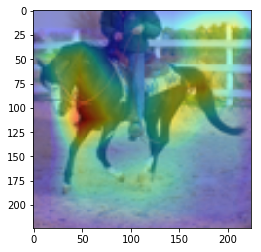

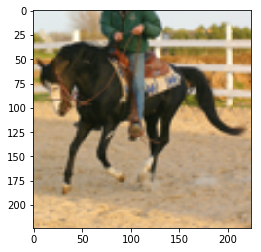

ANS : monkey  REAL : monkey 1


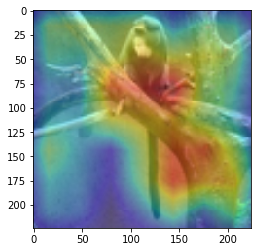

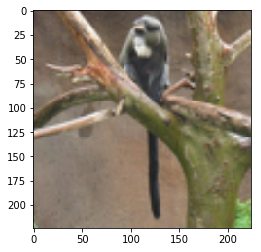

ANS : dog  REAL : dog 2


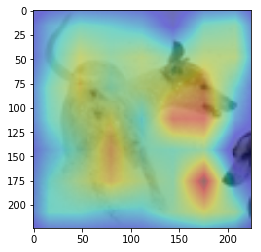

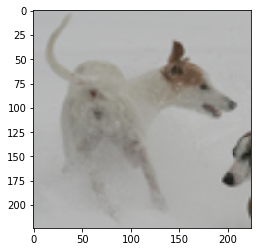

ANS : ship  REAL : airplance 3


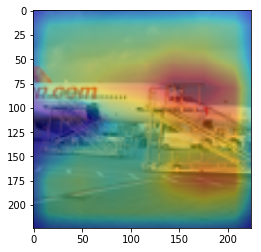

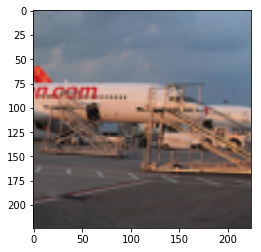

ANS : cat  REAL : cat 4


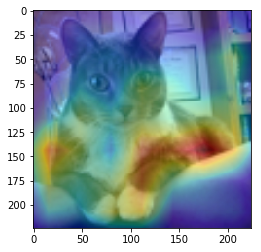

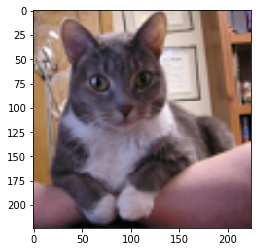

ANS : bird  REAL : bird 5


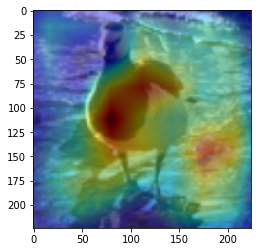

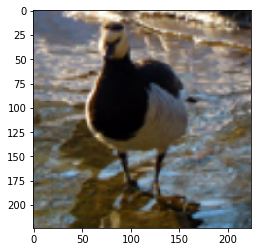

ANS : horse  REAL : bird 6


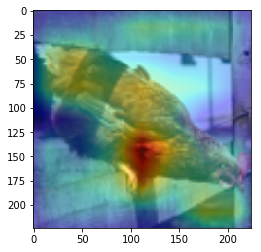

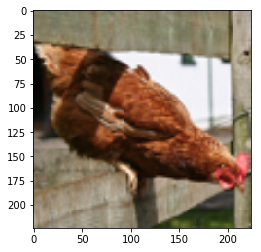

ANS : bird  REAL : bird 7


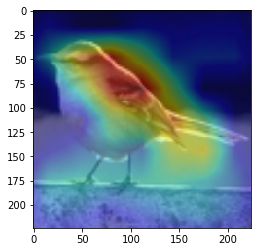

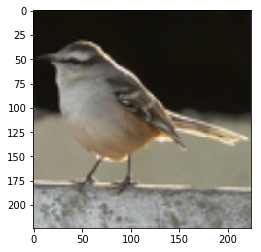

ANS : deer  REAL : deer 8


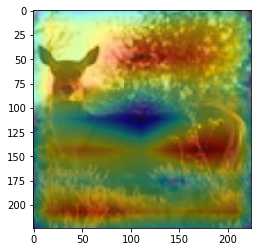

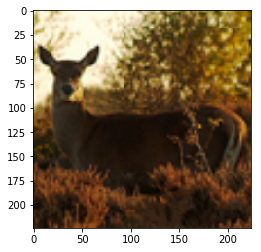

ANS : horse  REAL : deer 9


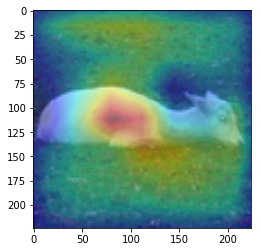

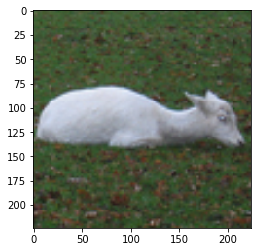

ANS : bird  REAL : airplance 10


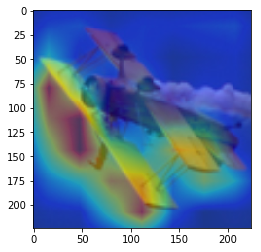

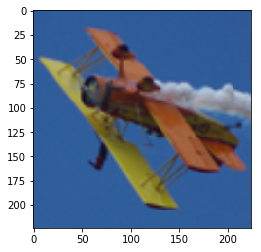

ANS : airplance  REAL : airplance 11


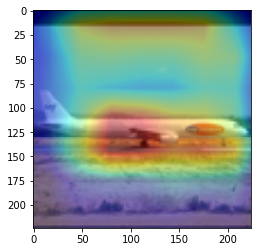

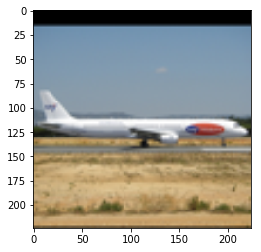

ANS : deer  REAL : deer 12


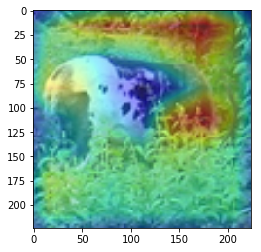

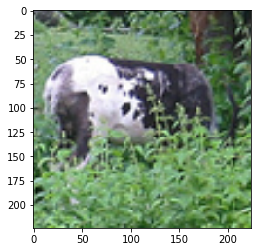

ANS : airplance  REAL : airplance 13


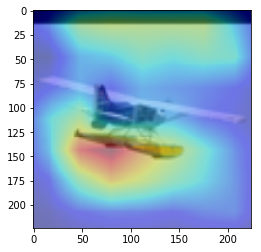

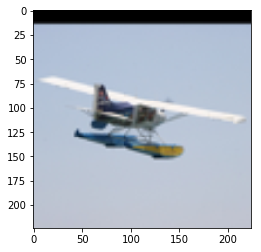

ANS : cat  REAL : bird 14


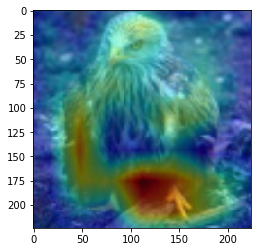

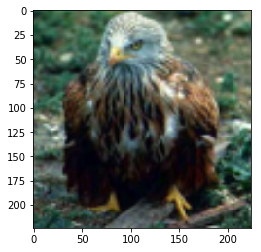

ANS : cat  REAL : dog 15


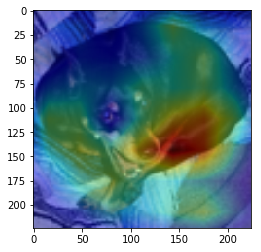

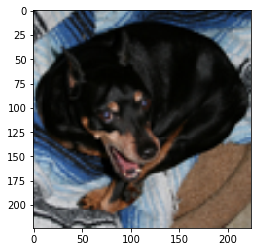

ANS : deer  REAL : deer 16


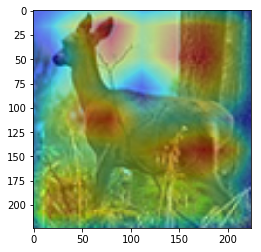

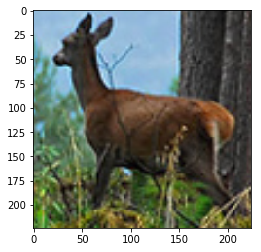

ANS : truck  REAL : truck 17


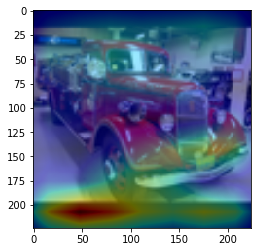

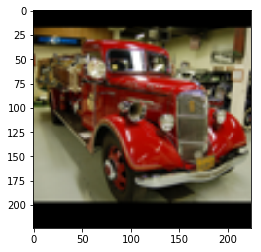

ANS : airplance  REAL : airplance 18


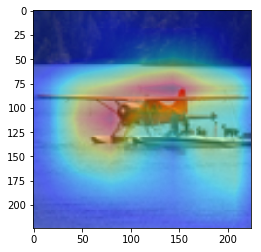

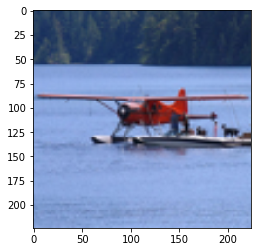

ANS : horse  REAL : horse 19


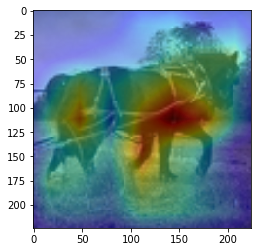

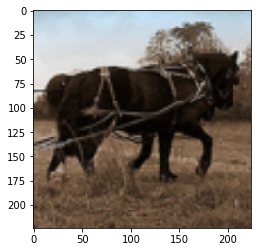

ANS : horse  REAL : dog 20


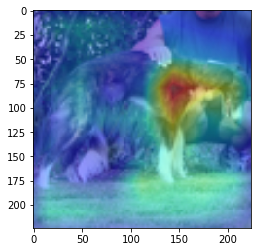

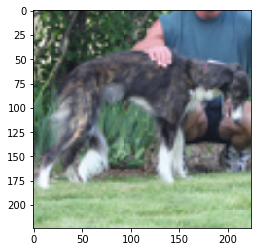

ANS : cat  REAL : cat 21


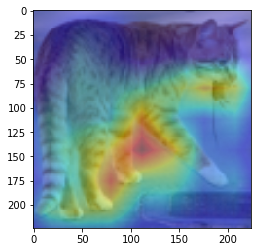

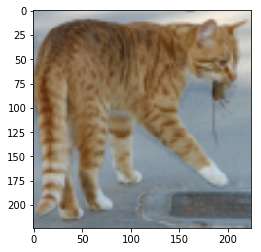

ANS : dog  REAL : bird 22


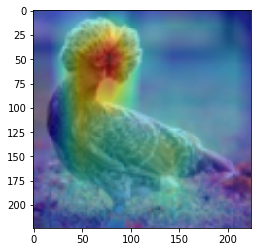

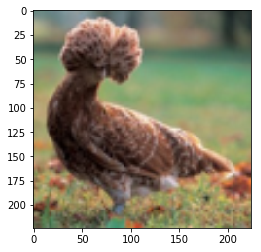

ANS : cat  REAL : cat 23


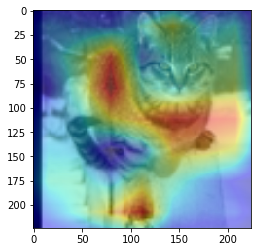

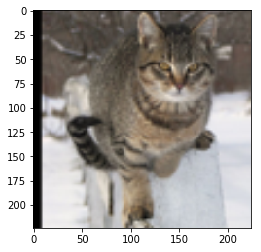

ANS : car  REAL : car 24


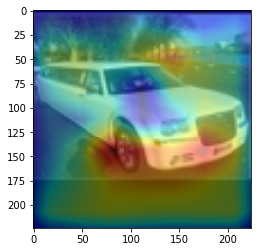

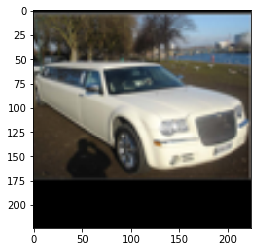

ANS : horse  REAL : horse 25


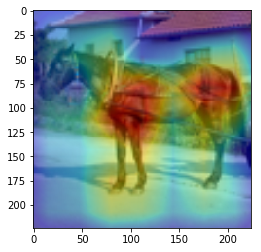

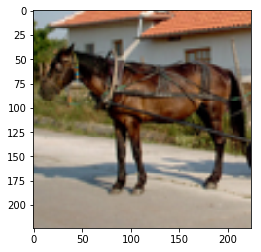

ANS : bird  REAL : dog 26


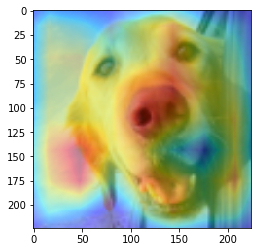

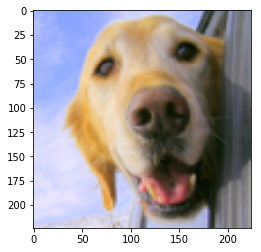

ANS : cat  REAL : dog 27


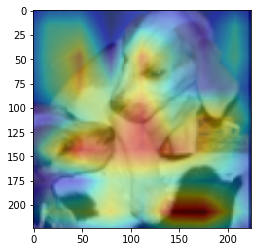

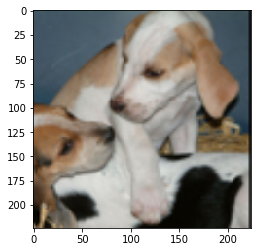

ANS : truck  REAL : car 28


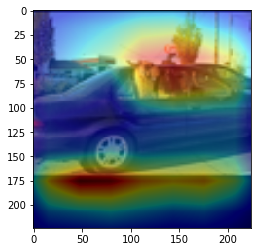

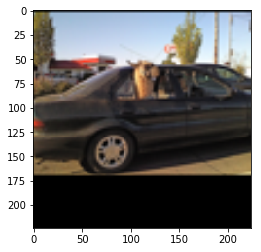

ANS : dog  REAL : monkey 29


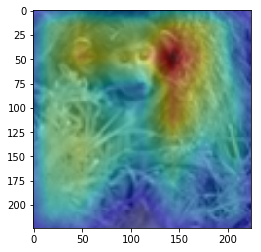

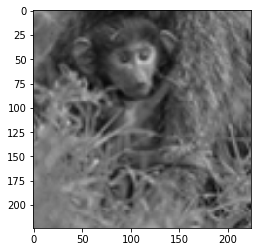

ANS : truck  REAL : bird 30


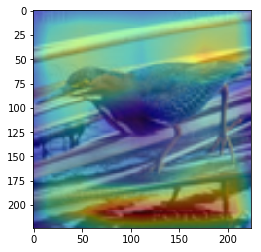

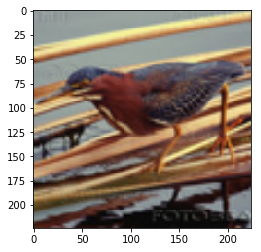

ANS : horse  REAL : horse 31


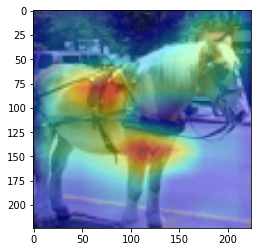

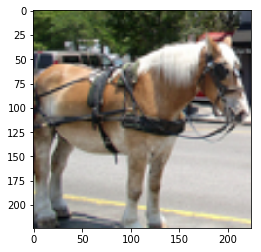

ANS : dog  REAL : cat 32


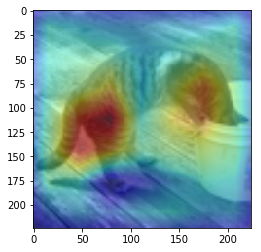

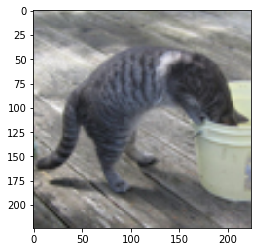

ANS : monkey  REAL : monkey 33


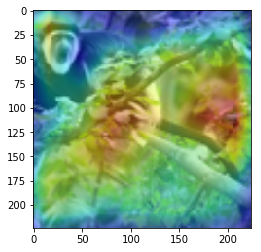

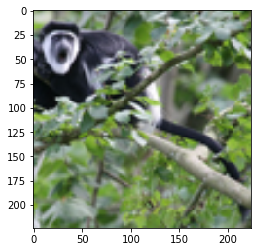

ANS : truck  REAL : truck 34


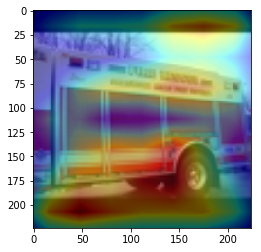

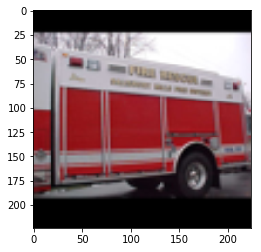

ANS : truck  REAL : car 35


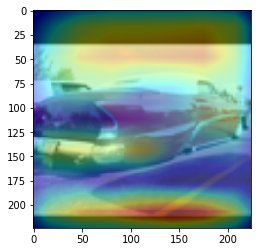

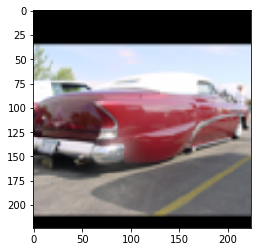

ANS : deer  REAL : deer 36


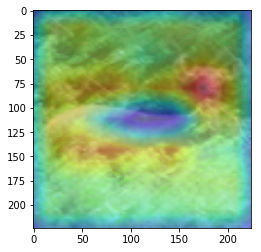

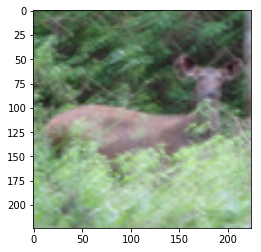

ANS : monkey  REAL : monkey 37


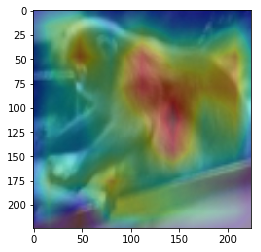

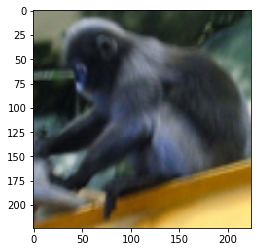

ANS : truck  REAL : truck 38


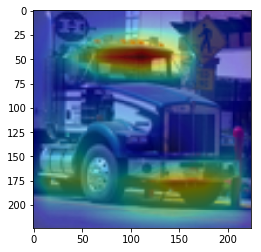

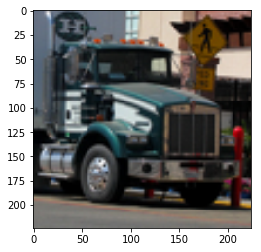

ANS : horse  REAL : dog 39


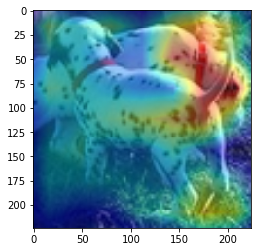

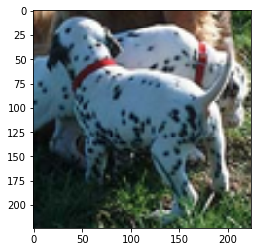

ANS : bird  REAL : bird 40


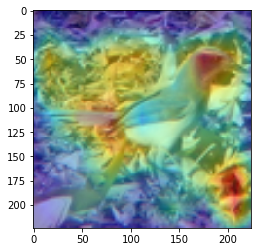

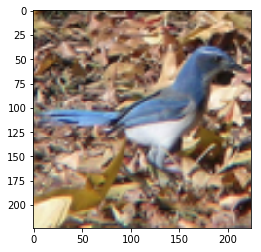

ANS : airplance  REAL : truck 41


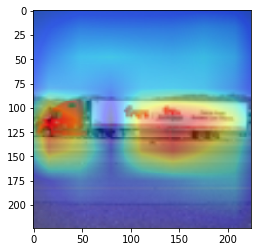

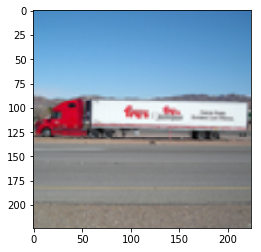

ANS : airplance  REAL : airplance 42


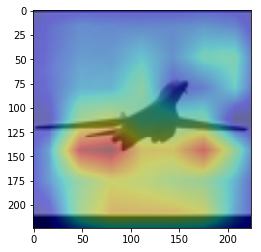

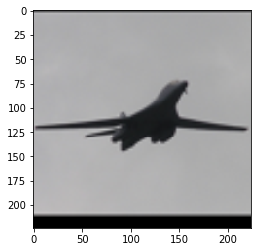

ANS : horse  REAL : horse 43


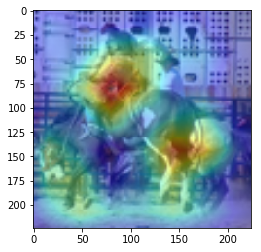

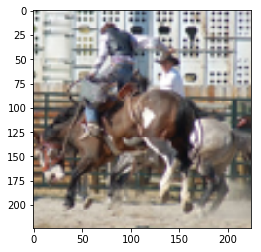

ANS : deer  REAL : deer 44


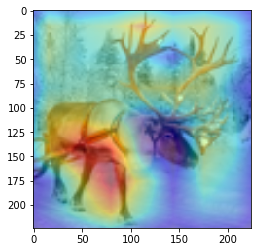

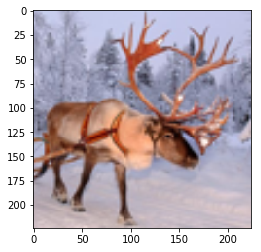

ANS : truck  REAL : truck 45


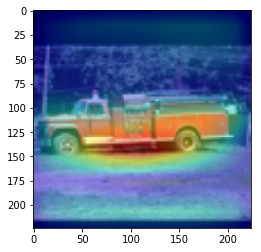

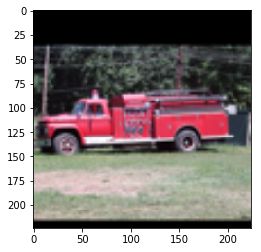

ANS : bird  REAL : bird 46


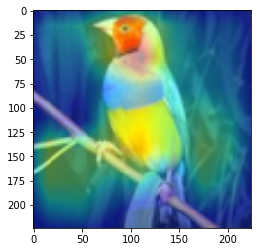

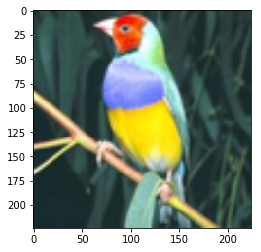

ANS : bird  REAL : bird 47


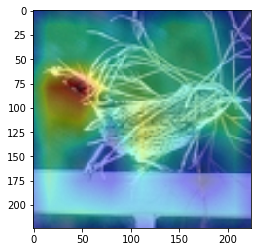

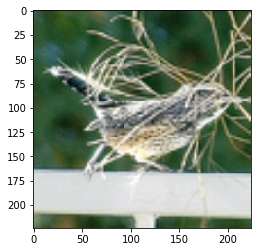

ANS : cat  REAL : cat 48


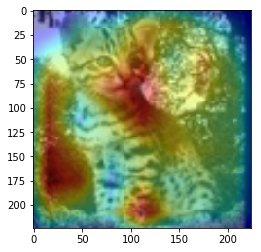

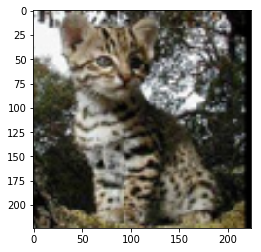

ANS : car  REAL : car 49


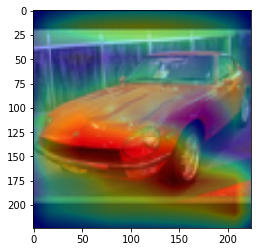

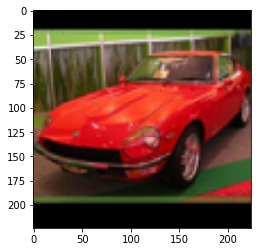

ANS : cat  REAL : dog 50


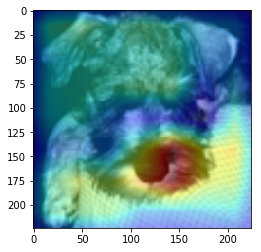

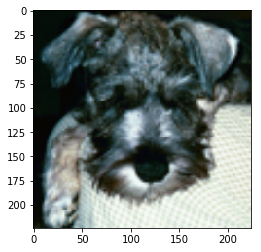

ANS : cat  REAL : deer 51


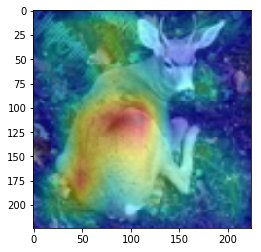

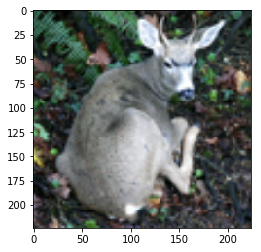

ANS : airplance  REAL : airplance 52


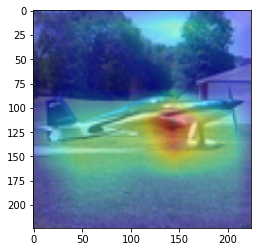

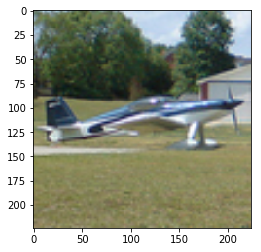

ANS : airplance  REAL : airplance 53


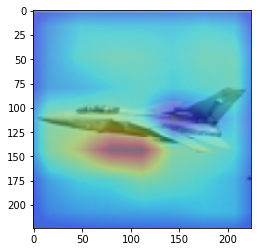

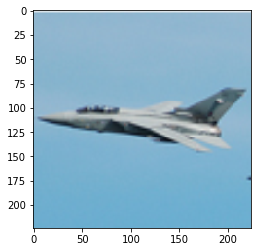

ANS : car  REAL : truck 54


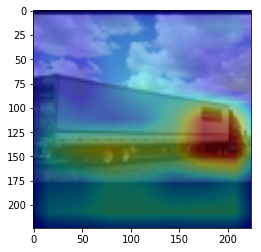

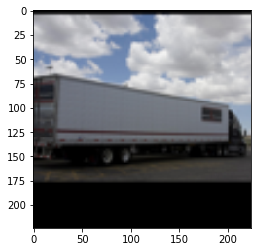

ANS : ship  REAL : ship 55


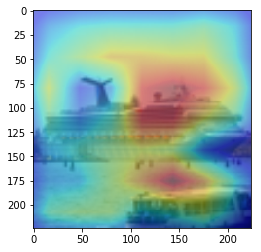

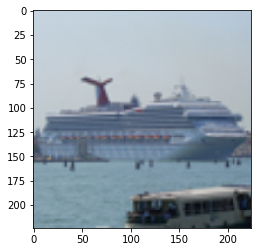

ANS : horse  REAL : horse 56


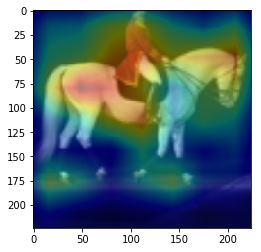

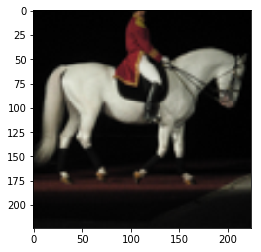

ANS : monkey  REAL : monkey 57


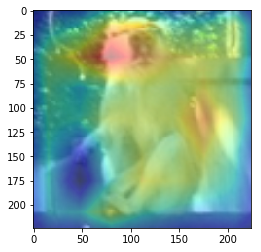

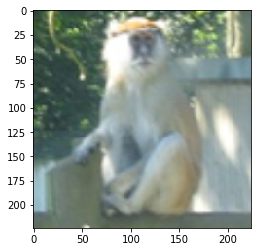

ANS : car  REAL : car 58


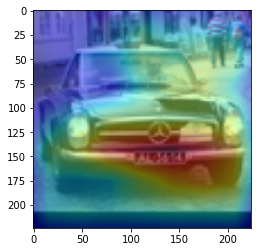

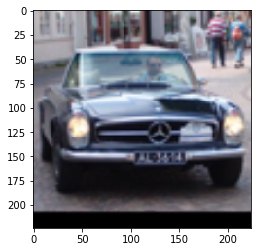

ANS : ship  REAL : airplance 59


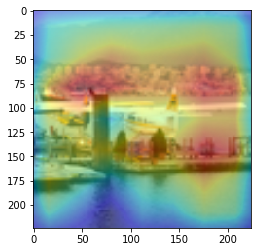

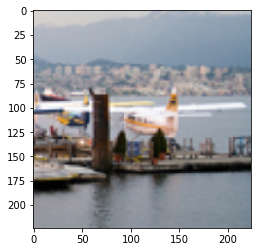

ANS : airplance  REAL : airplance 60


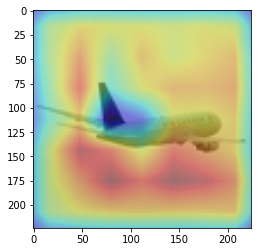

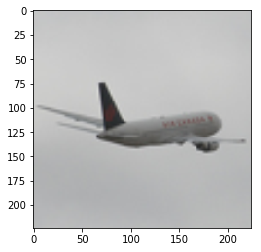

ANS : dog  REAL : bird 61


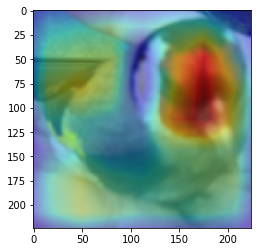

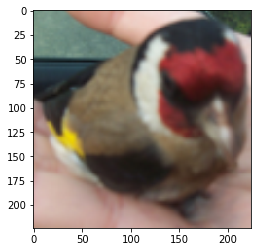

ANS : bird  REAL : bird 62


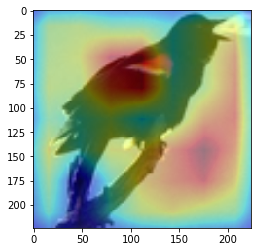

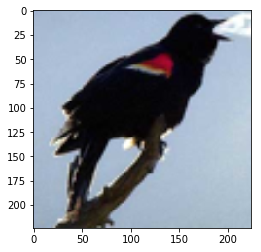

ANS : monkey  REAL : monkey 63


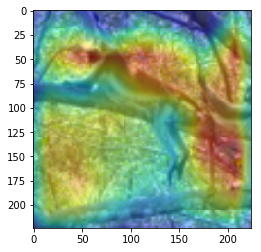

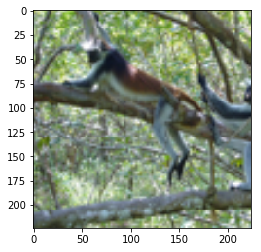

In [10]:
import skimage.transform
classes =  ('airplance', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck')
params = list(net.parameters())
num = 0
for num in range(64):
    print("ANS :",classes[int(predicted[num])]," REAL :",classes[int(labels[num])],num)
    
    #print(outputs[0])
    
    overlay = params[-2][int(predicted[num])].matmul(f[num].reshape(512,49)).reshape(7,7).cpu().data.numpy()

    overlay = overlay - np.min(overlay)
    overlay = overlay / np.max(overlay)

    imshow(images[num].cpu())
    skimage.transform.resize(overlay, [224,224])
    plt.imshow(skimage.transform.resize(overlay, [224,224]), alpha=0.4,cmap='jet')
    plt.show()
    imshow(images[num].cpu())
    plt.show()
    
#plt.imshow(params[-2][int(predicted[num])].matmul(f[num].reshape(512,49)).reshape(7,7).cpu().data.numpy(), alpha=0.5,cmap='jet');

CAM을 구현하였다.

CAM의 구현은 앞에서 적은 [저자들의 코드](https://github.com/metalbubble/CAM/blob/master/pytorch_CAM.py)를 참고하였다. (CAM의 구현은 Pytorch로 구현되어있음)



`overlay = params[-2][int(predicted[num])].matmul(f[num].reshape(512,49)).reshape(7,7).cpu().data.numpy()`

이 부분 위와 아래는, 정규화 나 이미지 출력을 위한 부분이며, 해당 부분이 핵심이다.

params[-2] 는 뒤에서 부터 두번째 레이어 이다. 이는, 512x1 input을 받는 FC레이어의 weight값들 이다. 즉 512x1 의 크기를 가진다. 이것과 matmul(행렬곱)을 하는 f[num]은 512개의 채널을 가지는 7x7 행렬들 이다. 이를 512x49로 리쉐잎을 하는 이유는 행렬곱이 2차원 행렬 끼리의 곱만 지원하기 때문이다.

마지막으로 이것을 cpu로 바꿔주고 넘파이로 바꿔주며 끝을 낸다. cpu로 바꿔주지 않고 numpy로 바꿀 경우 오류가 나게 된다.

`    imshow(images[num].cpu())
    skimage.transform.resize(overlay, [224,224])
    plt.imshow(skimage.transform.resize(overlay, [224,224]), alpha=0.4,cmap='jet')
    plt.show()`
    
이 부분을 통해 이미지를 출력하게 된다. 먼저, imshow로 원본 이미지를 출력해 주고, 같은 팔레트에 위에서 계산한 overlay(cam 값)을 그려준다.

이를 위해, 이미지와 같은 크기(224x224)로 리사이징을 하고, imshow의 argument 값에 alpha 값을 0.4로 설정해 주어 반투명 하게 덮어씌워주도록 한다.

위 출력에서 아래에 원본 이미지가 출력되는 것은 아랫줄에서 원본 이미지만 다시 한번 출력하기 때문이다.

여기서 주의하여야 하는 점은, plt.show()를 해야 현재 팔래트를 화면에 출력하고 새로운 팔래트를 준비한다는 점 이다.

결과를 통해, 해당 모델(VGG19)에서 어느 부분을 통해 해당 클래스로 판별한 것 인지 확인 가능했다.(일부 결과의 경우 특이한 결과를 보여주는데, 사슴(deer)의 경우 사슴본체 보단 주변 풀숲에서 높은 값이 보이는 것이 한 예 이다.)